# Satellite Imagery Analysis

Satellite images are images of the Earth collected by imaging satellites operated by governments
and businesses around the world. In this workshop we explore some of the data science behind
satellite imagery analysis with Python.

**Dataset**
- Satellite images of the Sundarbans, in the delta formed by the confluence of the Ganges,
  Brahmaputra and Meghna rivers in the Bay of Bengal.
- The Sundarbans stretch approximately 10,000 km² across India and Bangladesh, 40% of which is
  in India, and are home to many rare and globally threatened species.
- We use a very small part of the Sundarbans region for the task of analysing satellite imagery
  with Python.
- The data were acquired by the
  [Sentinel-2 satellite](https://dataspace.copernicus.eu/explore-data/data-collections/sentinel-data/sentinel-2)
  on 27 January 2020.
- The extract is **954 × 298 pixels across 12 bands**, with a **spatial** resolution ranging from
  10 m to 60 m depending on the band.

**Libraries**
- **Rasterio** — reading and writing raster data, a good choice for geospatial TIFF files.

In [1]:
from IPython.display import HTML

# The "code" is taken from Google Maps (Find a location --> Share --> Embed A Map --> Copy Link)
HTML('''
<iframe src="https://www.google.com/maps/embed?pb=!1m16!1m12!1m3!1d473444.9983858136!2d88.95734441728473!3d22.0193923697073!2m3!1f0!2f0!3f0!3m2!1i1024!2i768!4f13.1!2m1!1sSundarbans%20forest%20!5e0!3m2!1sen!2sau!4v1726727101306!5m2!1sen!2sau" width="600" height="450" style="border:0;" allowfullscreen="" loading="lazy" referrerpolicy="no-referrer-when-downgrade"></iframe>
''')

## Libraries

The original version of this notebook used **EarthPy** for plotting. EarthPy has not been
updated since October 2021 and now fails on import in a current environment:

```
ModuleNotFoundError: No module named 'pkg_resources'
```

The cause is worth understanding, because you will meet it again. EarthPy runs
`from pkg_resources import resource_string` at import time, purely to load an EPSG lookup table
that nothing in this notebook uses. `pkg_resources` shipped with **setuptools**, was deprecated,
and has now been removed. So an unmaintained package takes down your session over a dependency
you never asked for and never needed.

You could revive it with `pip install "setuptools<81"`, but pinning a build tool backwards to
keep a dead library breathing is a poor trade, and it will break again. Instead we replace the
four EarthPy functions this notebook actually uses with about sixty lines of `matplotlib` and
`numpy`.

**The call sites do not change.** We rebuild `ep` and `es` as small namespaces holding our own
functions, so every `ep.plot_bands(...)` and `es.normalized_diff(...)` below works exactly as
written. If EarthPy is ever repaired, delete the helper cell and restore the import.

One deliberate improvement over the original: our `normalized_diff` **casts to float
internally**. EarthPy's did not, which is precisely what allowed the integer-underflow bug this
notebook used to contain.

In [2]:
from glob import glob
import re
import types

import rasterio as rio
import matplotlib.pyplot as plt
import numpy as np


# ---------------------------------------------------------------------------
# Drop-in replacements for the EarthPy functions this notebook uses.
# You do not need to read this cell to follow the workshop, but it is short.
# ---------------------------------------------------------------------------

def normalized_diff(b1, b2):
    # (b1 - b2) / (b1 + b2), computed in floating point.
    #
    # The float cast is the important part. The bands are stored as uint16,
    # which cannot represent a negative number, so on the raw arrays b1 - b2
    # wraps around whenever b1 < b2 - which, over water, is most of this scene.
    b1 = np.asarray(b1, dtype="float32")
    b2 = np.asarray(b2, dtype="float32")
    den = b1 + b2
    out = np.full(b1.shape, np.nan, dtype="float32")
    np.divide(b1 - b2, den, out=out, where=den != 0)
    return out


def _scale01(a, clip_pct=None):
    # Scale one 2-D array to 0-1 for display, optionally clipping the tails.
    a = np.asarray(a, dtype="float32")
    if clip_pct:
        lo, hi = np.nanpercentile(a, [clip_pct, 100 - clip_pct])
    else:
        lo, hi = np.nanmin(a), np.nanmax(a)
    return np.clip((a - lo) / max(float(hi - lo), 1e-9), 0, 1)


def plot_bands(arr, cmap="Greys_r", figsize=(12, 12), cols=3, title=None,
               vmin=None, vmax=None, cbar=True, ax=None):
    # Plot a single 2-D array, or a grid of panels for a 3-D stack.
    arr = np.asarray(arr, dtype="float32")

    if arr.ndim == 2:                                   # one image
        if ax is None:
            _fig, ax = plt.subplots(figsize=figsize)
        im = ax.imshow(arr, cmap=cmap, vmin=vmin, vmax=vmax)
        if title:
            ax.set_title(title)
        ax.set_xticks([]); ax.set_yticks([])
        if cbar:
            ax.figure.colorbar(im, ax=ax, shrink=0.7)
        return ax

    n = arr.shape[0]                                    # a stack of images
    cols = max(1, min(cols, n))
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.atleast_1d(axes).ravel()
    titles = list(title) if title is not None else [f"Band {i + 1}" for i in range(n)]
    for i in range(n):
        im = axes[i].imshow(arr[i], cmap=cmap, vmin=vmin, vmax=vmax)
        axes[i].set_title(titles[i], fontsize=9)
        axes[i].set_xticks([]); axes[i].set_yticks([])
        if cbar:
            fig.colorbar(im, ax=axes[i], shrink=0.6)
    for a in axes[n:]:
        a.axis("off")
    plt.tight_layout()
    return axes


def plot_rgb(arr, rgb=(0, 1, 2), ax=None, stretch=False, str_clip=2,
             figsize=(10, 10), title=None):
    # Map three chosen bands to the display red, green and blue channels.
    sub = np.asarray(arr, dtype="float32")[list(rgb)]
    img = np.dstack([_scale01(sub[i], str_clip if stretch else None) for i in range(3)])
    if ax is None:
        _fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(np.nan_to_num(img))
    if title:
        ax.set_title(title)
    ax.set_xticks([]); ax.set_yticks([])
    return ax


def hist(arr, colors=None, title=None, cols=3, alpha=1.0, bins=50, figsize=(12, 12)):
    # One histogram per band in a 3-D stack.
    arr = np.asarray(arr, dtype="float32")
    n = arr.shape[0]
    cols = max(1, min(cols, n))
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.atleast_1d(axes).ravel()
    titles = list(title) if title is not None else [f"Band {i + 1}" for i in range(n)]
    for i in range(n):
        vals = arr[i].ravel()
        axes[i].hist(vals[np.isfinite(vals)], bins=bins, alpha=alpha,
                     color=(colors[i % len(colors)] if colors else None))
        axes[i].set_title(titles[i], fontsize=9)
    for a in axes[n:]:
        a.axis("off")
    plt.tight_layout()
    return axes


# Same call syntax as before, so nothing below this cell had to change.
ep = types.SimpleNamespace(plot_bands=plot_bands, plot_rgb=plot_rgb, hist=hist)
es = types.SimpleNamespace(normalized_diff=normalized_diff)

print("Plotting helpers ready: ep.plot_bands, ep.plot_rgb, ep.hist, es.normalized_diff")

Plotting helpers ready: ep.plot_bands, ep.plot_rgb, ep.hist, es.normalized_diff


## A first look at one file

Before reading everything, open a single band and inspect it.

In [3]:
# Open the TIFF file
file_path = 'data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B01_(Raw).tiff'
with rio.open(file_path) as src:
    width = src.width
    height = src.height
    bands = src.count
    bit_depth = src.dtypes[0]
    crs = src.crs
    metadata = src.meta

    print(f"Dimensions: {height} x {width}")
    print(f"Number of Bands: {bands}")
    print(f"Bit Depth: {bit_depth}")
    print(f"CRS: {crs}")

print()
print("Note on 'Number of Bands: 2'. This file holds ONE spectral band (B01), but the")
print("export from Copernicus Browser adds a second channel: an alpha (validity) mask,")
print("where 0 marks pixels with no data. So band 1 is the measurement and band 2 tells")
print("you where the measurement is real. We read band 1 below, and use band 2 as a mask.")

Dimensions: 954 x 298
Number of Bands: 2
Bit Depth: uint16
CRS: EPSG:4326

Note on 'Number of Bands: 2'. This file holds ONE spectral band (B01), but the
export from Copernicus Browser adds a second channel: an alpha (validity) mask,
where 0 marks pixels with no data. So band 1 is the measurement and band 2 tells
you where the measurement is real. We read band 1 below, and use band 2 as a mask.


## Read in satellite data files

Each band is stored in its own file. We glob them, sort them, and — importantly — **record which
band each position in the stack corresponds to**, rather than assuming the sort order matches the
band numbering.

That assumption is a trap. A plain alphabetical sort puts **`B8A` after `B12`**, because the
character `8` sorts after `0` and `1`. So the stack is not in instrument order, and counting
positions by eye will silently give you the wrong band.

In [4]:
np.seterr(divide='ignore', invalid='ignore')

S_sentinel_bands = glob("data/*B?*.tiff")
S_sentinel_bands.sort()

# Recover the band identifier from each filename, so we never have to count positions.
band_ids = [re.search(r'_(B\w{2})_', p).group(1) for p in S_sentinel_bands]
BAND = {b: i for i, b in enumerate(band_ids)}

for i, (b, p) in enumerate(zip(band_ids, S_sentinel_bands)):
    print(f"  index {i:2d}  ->  {b}   {p.split('_')[-2]}")
print()
print("Note the last three. Alphabetical order gives ... B09, B11, B12, B8A.")
print("B8A is at index 11, NOT index 8. Use BAND['B8A'] and never a hard-coded number.")

  index  0  ->  B01   B01
  index  1  ->  B02   B02
  index  2  ->  B03   B03
  index  3  ->  B04   B04
  index  4  ->  B05   B05
  index  5  ->  B06   B06
  index  6  ->  B07   B07
  index  7  ->  B08   B08
  index  8  ->  B09   B09
  index  9  ->  B11   B11
  index 10  ->  B12   B12
  index 11  ->  B8A   B8A

Note the last three. Alphabetical order gives ... B09, B11, B12, B8A.
B8A is at index 11, NOT index 8. Use BAND['B8A'] and never a hard-coded number.


## Sentinel-2 satellite

Sentinel-2 is a multi-spectral imaging mission from the European Space Agency (ESA) providing
high-resolution optical imagery for land monitoring. The satellites carry the Multi-Spectral
Instrument (MSI), which captures data in 13 spectral bands.

| Band | Name | Central wavelength | Resolution | Purpose |
|---|---|---|---|---|
| B01 | Coastal aerosol | 443 nm | 60 m | Coastal and aerosol studies |
| B02 | Blue | 490 nm | 10 m | Water bodies, coastal monitoring |
| B03 | Green | 560 nm | 10 m | Vegetation, chlorophyll, water indices |
| B04 | Red | 665 nm | 10 m | Chlorophyll absorption |
| B05 | Red Edge 1 | 705 nm | 20 m | Vegetation chlorophyll content |
| B06 | Red Edge 2 | 740 nm | 20 m | Vegetation monitoring |
| B07 | Red Edge 3 | 783 nm | 20 m | Chlorophyll and plant stress |
| B08 | NIR (broad) | 842 nm | 10 m | Vegetation indices such as NDVI |
| B8A | NIR (narrow) | 865 nm | 20 m | Narrow NIR, pairs with the 20 m bands |
| B09 | Water vapour | 945 nm | 60 m | Atmospheric correction |
| B10 | Cirrus | 1375 nm | 60 m | Cirrus cloud detection |
| B11 | SWIR 1 | 1610 nm | 20 m | Moisture in plants and soil, snow and ice |
| B12 | SWIR 2 | 2190 nm | 20 m | Soil and vegetation moisture, minerals, char |

**Two things to notice about our files.**

**B10 is missing, and that is correct.** Band 10 exists only in Level-1C products. It is used to
detect cirrus cloud during atmospheric correction and is then discarded, so a Level-2A product
has **twelve** bands, not thirteen.

**B8A is a narrow near-infrared band, not a red edge band.** It sits at 865 nm, just beyond
B08, and exists so that a 20 m analysis can use a NIR band at native 20 m resolution.

## Visualise bands

The dataset contains 12 bands with a **spatial** resolution ranging from 10 m to 60 m.

- `arr_st`: the array in which we store all the images containing the different spectral bands.
- Each band records a different range of wavelengths (blue, green, red, near infrared, and so on).

### Why use different bands?

Consider the near-infrared. The NIR region covers roughly 700 nm to 1400 nm, just beyond the
visible range your eye can detect.

- **Remote sensing.** NIR carries information about vegetation, water, and soil that simply is
  not present in standard red-green-blue imagery.
- **Vegetation analysis.** Healthy vegetation reflects a large amount of NIR and absorbs visible
  light for photosynthesis, so NIR reflectance tracks plant health, density and stress.
- **Agriculture.** NIR imagery supports crop monitoring and yield estimation.

### One critical detail when reading the data

We read the bands as **floating point**, not as the 16-bit integers stored in the file.

This is not cosmetic. The stored type is `uint16`, which cannot represent negative numbers. If
you subtract two `uint16` arrays and the result should be negative, it **wraps around** to a
large positive number instead. Over water, where near-infrared is *lower* than red, that turns
an NDVI of about −0.3 into about +59, which then saturates the colour scale. The map still looks
plausible, and it is completely wrong.

Casting once, on read, removes the whole class of problem.

arr_st shape : (12, 954, 298)   dtype: float32
value range  : 0 to 35913
valid pixels : 92.9% (the rest is border with no data)


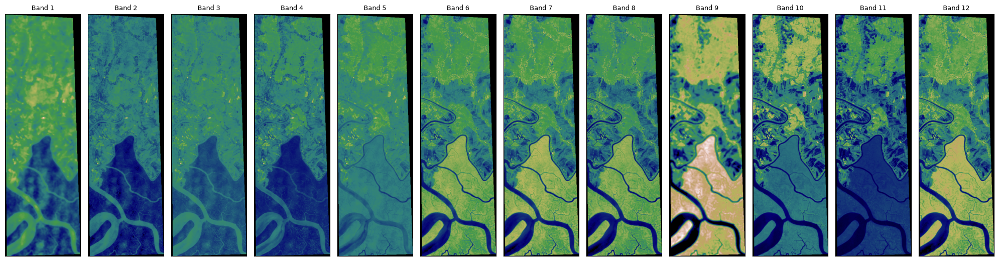

In [5]:
l = []
masks = []
for i in S_sentinel_bands:
    with rio.open(i, 'r') as f:
        l.append(f.read(1).astype("float32"))   # band 1 = the measurement, cast to float
        if f.count > 1:
            masks.append(f.read(2) > 0)         # band 2 = alpha, non-zero where data is valid

arr_st = np.stack(l)
valid = np.all(np.stack(masks), axis=0) if masks else np.ones(arr_st.shape[1:], bool)

print(f"arr_st shape : {arr_st.shape}   dtype: {arr_st.dtype}")
print(f"value range  : {arr_st.min():.0f} to {arr_st.max():.0f}")
print(f"valid pixels : {valid.mean()*100:.1f}% (the rest is border with no data)")

ep.plot_bands(arr_st, cmap='gist_earth', figsize=(20, 12), cols=12, cbar=False)
plt.show()

This dataset has several bands, spanning visible to infrared, which makes it difficult to
visualise directly. Creating an **RGB composite image** gives an effective overview.

- `ep.plot_rgb` is our own helper, defined in the setup cell above.
- It maps three chosen bands to the display's red, green and blue channels.

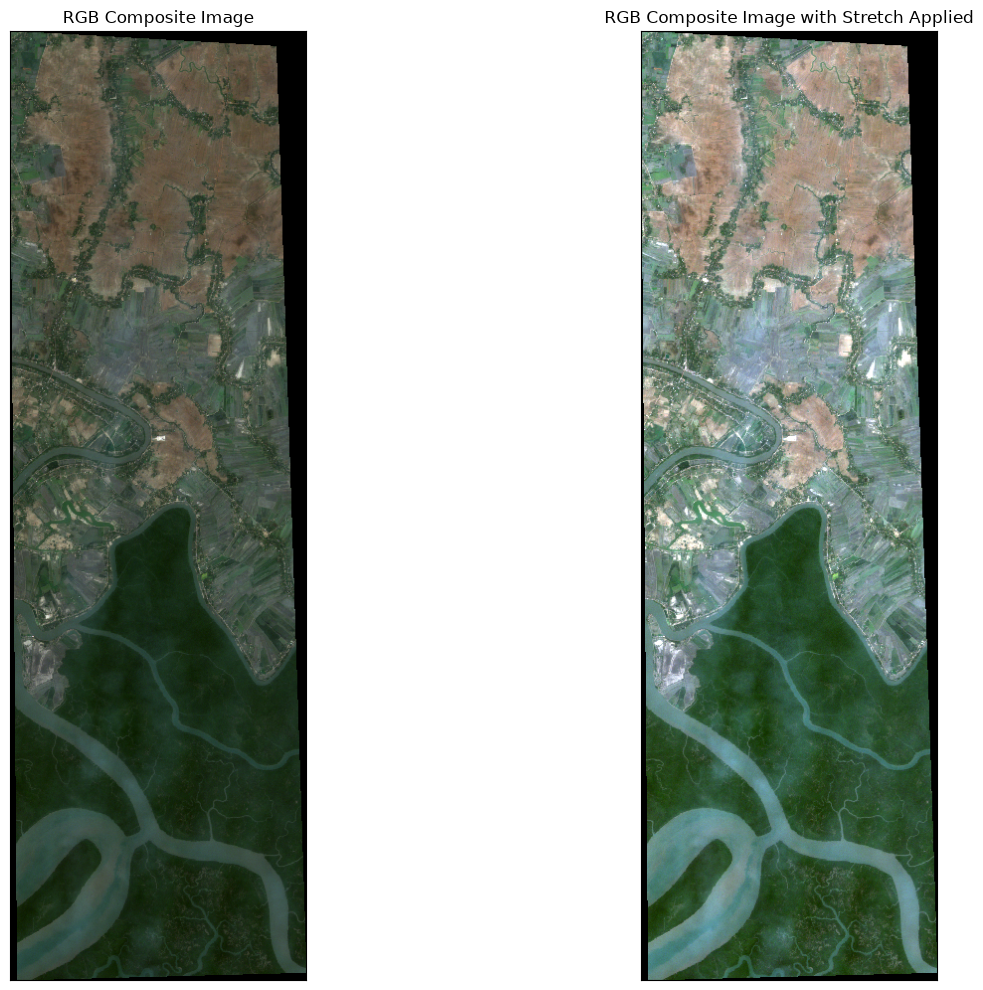

In [6]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 10))

rgb = (BAND['B04'], BAND['B03'], BAND['B02'])   # Red, Green, Blue - by name, not by counting

ep.plot_rgb(arr_st, rgb=rgb, ax=ax1)
ax1.set_title('RGB Composite Image')

ep.plot_rgb(
    arr_st,
    rgb=rgb,
    stretch=True,    # Enables contrast stretching
    str_clip=0.2,    # Clips 0.2% at each end of the histogram (a percentage, not a fraction)
    ax=ax2
)
ax2.set_title('RGB Composite Image with Stretch Applied')

plt.tight_layout()
plt.show()

Now let us look at the histogram of the dataset, which helps us understand how the values in
each band are distributed.

- **Y-axis**: the count of pixels falling into each bin.
- **X-axis**: the stored value for that band.

**What is the actual range of these numbers?** The files are stored as unsigned 16-bit integers,
so the *container* can hold anything from 0 to 65,535. But that is not the range of the data.
Sentinel-2 Level-2A stores **surface reflectance multiplied by 10,000**, so real values sit
mostly between about 0 and 10,000, with bright targets such as cloud running higher. Treating
65,535 as the maximum will make every image look almost black, as the next cell demonstrates.

Interpretation:
- A peak at a particular value means many pixels share that reflectance, which usually indicates
  a dominant land cover.
- A wide distribution indicates a more heterogeneous scene.
- Outliers or unusual spikes may indicate cloud, sun glint, or sensor artefacts.

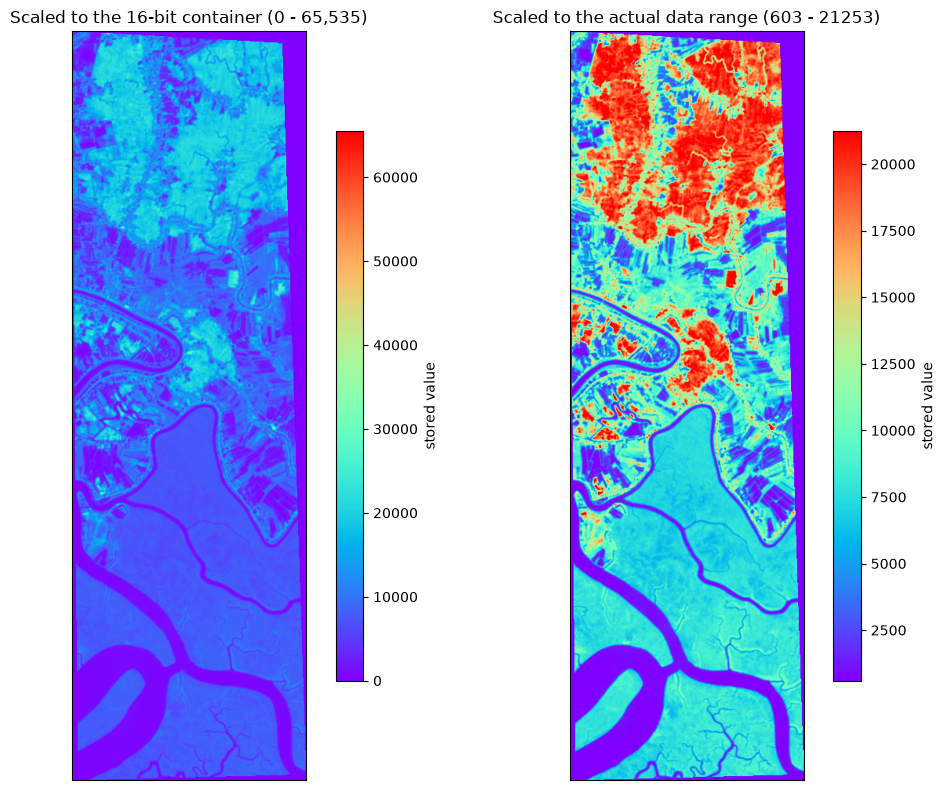

B11 actual range: 347 to 30644, out of a possible 65,535.
The left panel is not broken. It is what happens when you scale to the container
rather than to the data. Choosing display limits is an analytical decision.


In [7]:
# The same band displayed two ways, to make the point about value ranges.
file_path = 'data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B11_(Raw).tiff'
with rio.open(file_path) as src:
    band = src.read(1).astype("float32")

lo, hi = np.percentile(band[valid], [2, 98])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
im1 = ax1.imshow(band, cmap='rainbow', vmin=0, vmax=65535)
ax1.set_title('Scaled to the 16-bit container (0 - 65,535)')
fig.colorbar(im1, ax=ax1, fraction=0.046, label='stored value')

im2 = ax2.imshow(band, cmap='rainbow', vmin=lo, vmax=hi)
ax2.set_title(f'Scaled to the actual data range ({lo:.0f} - {hi:.0f})')
fig.colorbar(im2, ax=ax2, fraction=0.046, label='stored value')

for a in (ax1, ax2):
    a.set_xticks([]); a.set_yticks([])
plt.tight_layout(); plt.show()

print(f"B11 actual range: {band[valid].min():.0f} to {band[valid].max():.0f}, "
      f"out of a possible 65,535.")
print("The left panel is not broken. It is what happens when you scale to the container")
print("rather than to the data. Choosing display limits is an analytical decision.")

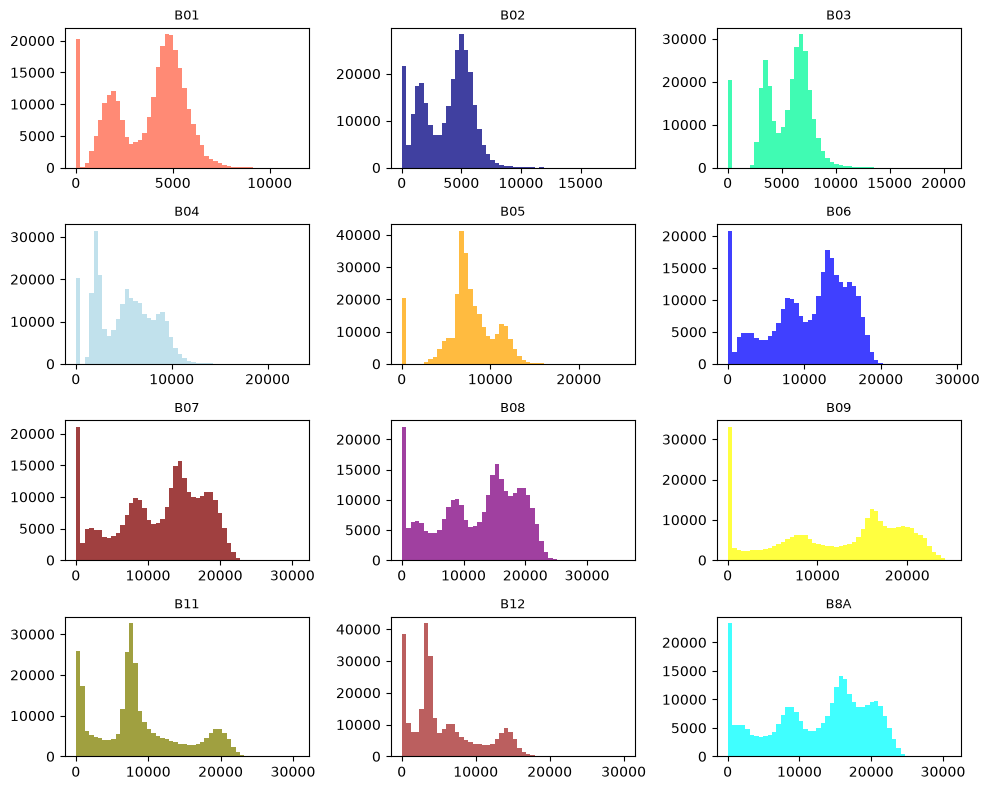

In [8]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']

ep.hist(arr_st,
        colors=colors,
        title=band_ids,        # the real band identifiers, in stack order
        cols=3,
        alpha=0.75,
        figsize=(10, 8)
        )
plt.show()

## From stored values to reflectance

One more step before we compute anything.

The numbers above are **stored values**, equal to surface reflectance multiplied by 10,000. Most
indices are ratios, and a ratio is unaffected by multiplying both inputs by the same constant, so
NDVI would survive without this conversion.

**SAVI would not.** It adds a constant $L = 0.5$ to the denominator, and $L$ is in reflectance
units. Against stored values in the thousands, $L$ is negligible, and SAVI silently collapses to
$(1+L) \times \text{NDVI}$ — a different index entirely, with a map that still looks perfectly
reasonable.

So we convert once, here, and work in reflectance from now on.

$$\rho = \frac{\text{stored value}}{10{,}000}$$

**A note for scenes acquired after 25 January 2022.** From processing baseline 04.00 onwards,
Sentinel-2 Level-2A products also carry an additive offset of $-1000$, so the conversion becomes
$\rho = (\text{DN} - 1000)/10{,}000$. Our scene is from **January 2020**, which predates that
change, so no offset applies here. Always check the baseline before reusing this code on a newer
scene.

In [9]:
SCALE = 10000.0
refl = arr_st / SCALE            # surface reflectance, roughly 0 to 1

print(f"reflectance range: {refl[:, valid].min():.3f} to {refl[:, valid].max():.3f}")
print()
print("Sanity check on a few bands, averaged over the scene:")
for b in ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']:
    print(f"  {b}: mean reflectance {refl[BAND[b]][valid].mean():.3f}")

reflectance range: 0.000 to 3.591

Sanity check on a few bands, averaged over the scene:
  B02: mean reflectance 0.403
  B03: mean reflectance 0.581
  B04: mean reflectance 0.548
  B08: mean reflectance 1.302
  B11: mean reflectance 0.936
  B12: mean reflectance 0.611


# Vegetation Indices

**Normalized Difference Vegetation Index (NDVI)**

To determine the density of green vegetation on a patch of land, we compare the visible and
near-infrared sunlight reflected by the plants. NDVI quantifies vegetation by measuring the
difference between near-infrared light, which vegetation strongly reflects, and red light, which
vegetation absorbs because of chlorophyll.

$$ NDVI = \frac{NIR - Red}{NIR + Red} $$

NDVI values range from −1 to +1:

- **Negative values** — non-vegetated surfaces such as water, snow and cloud.
- **Values close to zero** — little or no vegetation, such as bare soil or built-up areas.
- **Values close to +1** — healthy, dense green vegetation.

**Why bands B08 and B04**

- **B08 (NIR)** captures light that healthy green vegetation reflects strongly, because the
  internal cellular structure of a leaf scatters near infrared.
- **B04 (Red)** captures light that vegetation absorbs, because of chlorophyll.

Taking the difference between these two bands exploits the contrast between reflection and
absorption, giving a quantitative measure of vegetation vigour.

Now we analyse the vegetation of the Sundarbans region. **Watch the rivers.** They should come
out clearly negative. If they do not, something is wrong with the arithmetic rather than with
the mangroves.

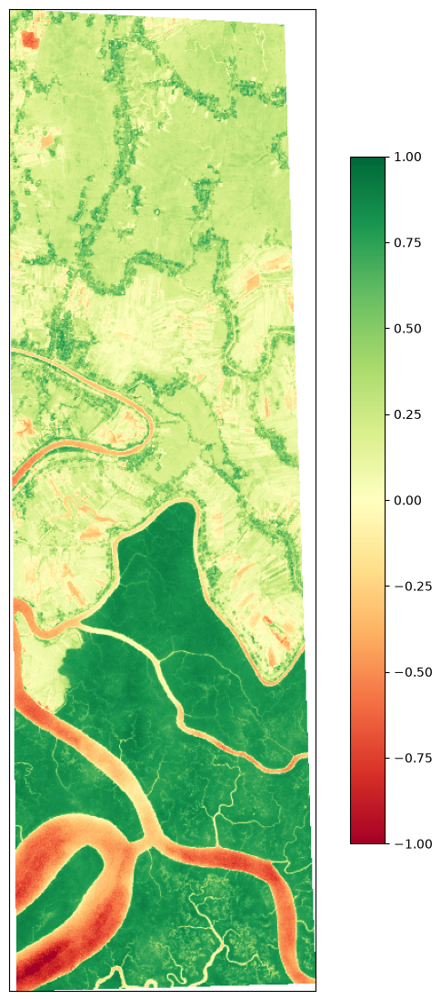

NDVI range : -0.997 to +0.931
pixels with NDVI < 0 (water and bare surfaces): 13.2%


In [10]:
ndvi = es.normalized_diff(refl[BAND['B08']], refl[BAND['B04']])

ep.plot_bands(ndvi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))
plt.show()

print(f"NDVI range : {np.nanmin(ndvi):+.3f} to {np.nanmax(ndvi):+.3f}")
print(f"pixels with NDVI < 0 (water and bare surfaces): {np.nanmean(ndvi < 0)*100:.1f}%")

## Soil Adjusted Vegetation Index (SAVI)

The Soil-Adjusted Vegetation Index minimises soil brightness influences using a soil-brightness
correction factor. It is often used in arid regions where vegetation cover is sparse.

SAVI addresses a limitation of NDVI: where vegetation is sparse, the reflectance of the
underlying soil skews the measurement. Adding a correction factor reduces that influence.

$$ SAVI = \frac{\left(NIR - Red\right)\times\left(1+L\right)}{NIR + Red + L} $$

where $L$ is the soil adjustment factor, typically between 0 and 1:

- $L = 0$ — no adjustment, equivalent to NDVI.
- $L = 1$ — maximum adjustment for soil brightness.
- $L = 0.5$ — the common choice, suitable for moderate vegetation cover.

**$L$ has units.** It is an additive term in reflectance space, so SAVI must be computed on
reflectance. This is exactly why we converted in the previous section. The cell below prints a
check: if the ratio of SAVI to NDVI comes out at a constant 1.5, then $L$ has been swamped and
you are not looking at SAVI at all.

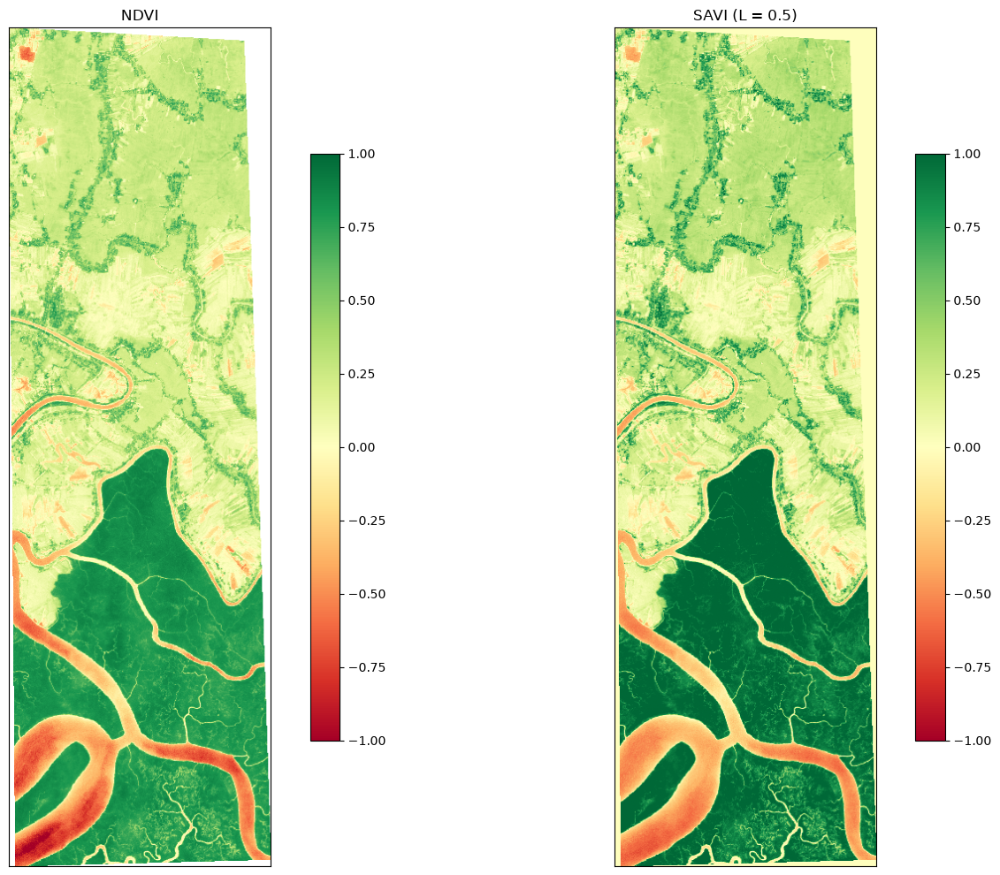

median SAVI / NDVI = 1.1997
PASS: not equal to (1 + L) = 1.5, so the soil adjustment term is doing work.


In [11]:
L = 0.5
nir, red = refl[BAND['B08']], refl[BAND['B04']]
savi = ((nir - red) / (nir + red + L)) * (1 + L)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 10))
ep.plot_bands(ndvi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, ax=ax1)
ax1.set_title('NDVI')
ep.plot_bands(savi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, ax=ax2)
ax2.set_title(f'SAVI (L = {L})')
plt.tight_layout(); plt.show()

ratio = np.nanmedian(np.asarray(savi)[valid] / np.asarray(ndvi)[valid])
print(f"median SAVI / NDVI = {ratio:.4f}")
if abs(ratio - (1 + L)) < 0.01:
    print(f"FAIL: that is (1 + L) = {1+L:.1f}. L has been swamped, so this is NDVI rescaled,")
    print("      not SAVI. You are almost certainly working in stored values, not reflectance.")
else:
    print(f"PASS: not equal to (1 + L) = {1+L:.1f}, so the soil adjustment term is doing work.")

## Visible Atmospherically Resistant Index (VARI)

VARI emphasises vegetation in the visible portion of the spectrum while mitigating illumination
differences and atmospheric effects. It is designed for RGB imagery and uses all three colour
bands.

VARI is useful because, unlike NDVI or SAVI, it **does not require near-infrared data**, which
makes it usable with ordinary cameras and low-cost sensors.

$$ VARI = \frac{Green - Red}{Green + Red - Blue} $$

**One caution.** The denominator can approach zero over bright or blue-dominated surfaces, and
VARI is then unbounded — values in the hundreds are possible. Clipping the colour scale to
[−1, 1] hides this rather than fixing it, so the cell below reports the true range as well.

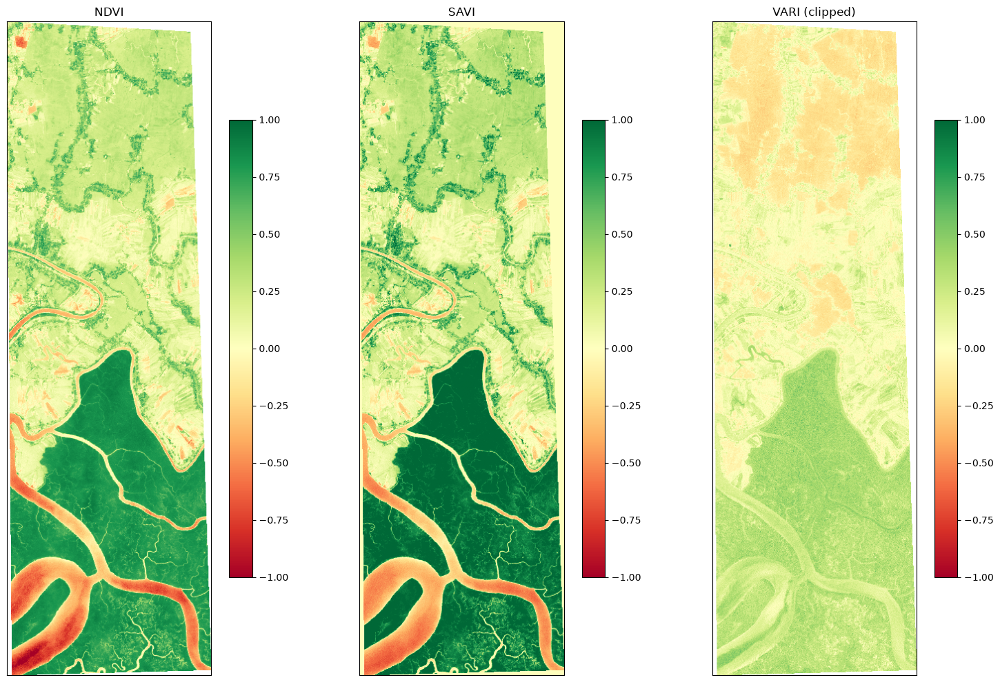

VARI true range      : -0.33 to +0.72
outside [-1, 1]      : 0.00% of valid pixels
Those pixels are all displayed at the ends of the colour bar, which is why the
clipped map looks tidier than the data actually is.


In [12]:
green, blue = refl[BAND['B03']], refl[BAND['B02']]
vari = (green - red) / (green + red - blue)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 10))
ep.plot_bands(ndvi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, ax=ax1); ax1.set_title('NDVI')
ep.plot_bands(savi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, ax=ax2); ax2.set_title('SAVI')
ep.plot_bands(vari, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, ax=ax3); ax3.set_title('VARI (clipped)')
plt.tight_layout(); plt.show()

v = vari[valid]
v = v[np.isfinite(v)]
print(f"VARI true range      : {v.min():+.2f} to {v.max():+.2f}")
print(f"outside [-1, 1]      : {np.mean(np.abs(v) > 1)*100:.2f}% of valid pixels")
print("Those pixels are all displayed at the ends of the colour bar, which is why the")
print("clipped map looks tidier than the data actually is.")

# Water Indices

Surface water change is an important indicator of environmental, climatic and human activity.
Remote sensors have been supplying suitable data for decades — Landsat since 1972, and
Sentinel-2 since 2015 — and index-based extraction methods remain popular because they are
simple and cheap.

## Modified Normalized Difference Water Index (MNDWI)

MNDWI uses the **green** and **SWIR 1** bands to enhance open water features. It also suppresses
built-up areas, which are often confused with water by other indices.

$$ MNDWI = \frac{Green - SWIR_1}{Green + SWIR_1} $$

On Sentinel-2 that is **B03 and B11**. Note carefully that Sentinel-2 has *two* SWIR bands: B11
at 1610 nm is SWIR 1, and B12 at 2190 nm is SWIR 2. Substituting B12 gives a plausible-looking
image and a different index. Water should come out **positive**; vegetation and soil
**negative**.

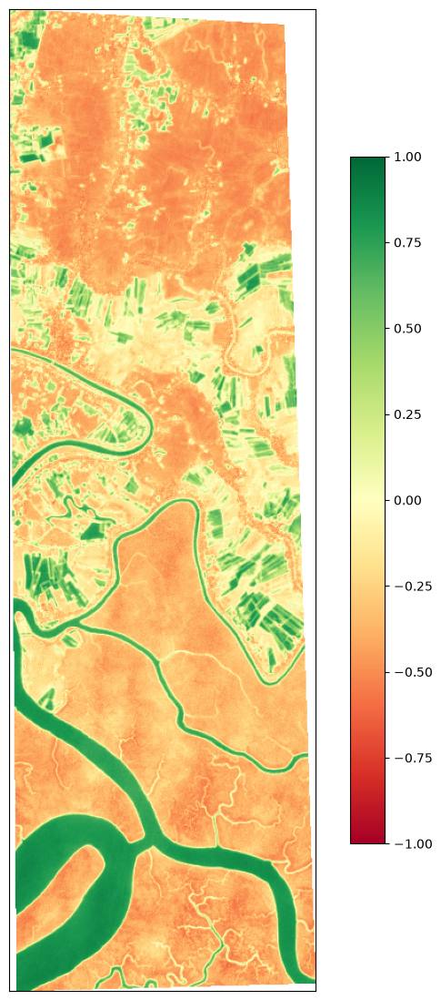

MNDWI range : -0.653 to +0.894
pixels with MNDWI > 0 (open water) : 21.8%


In [13]:
mndwi = es.normalized_diff(refl[BAND['B03']], refl[BAND['B11']])

ep.plot_bands(mndwi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))
plt.show()

print(f"MNDWI range : {np.nanmin(mndwi):+.3f} to {np.nanmax(mndwi):+.3f}")
print(f"pixels with MNDWI > 0 (open water) : {np.nanmean(mndwi > 0)*100:.1f}%")

## Normalized Difference Moisture Index (NDMI)

NDMI is sensitive to moisture in vegetation. It is used to monitor drought and to track fuel
condition in fire-prone areas. It uses the NIR and SWIR 1 bands, forming a ratio that mitigates
illumination and atmospheric effects.

$$ NDMI = \frac{NIR - SWIR_1}{NIR + SWIR_1} $$

On Sentinel-2 that is **B08 and B11**, again SWIR 1 rather than SWIR 2.

**A useful thing to know.** If you substitute B12 for B11 here you do not get a broken index —
you get a *different, valid* index. $(B08 - B12)/(B08 + B12)$ is the Normalized Burn Ratio, used
for mapping fire severity. Two well-known indices differing by one band is precisely why band
identifiers should be written out rather than counted.

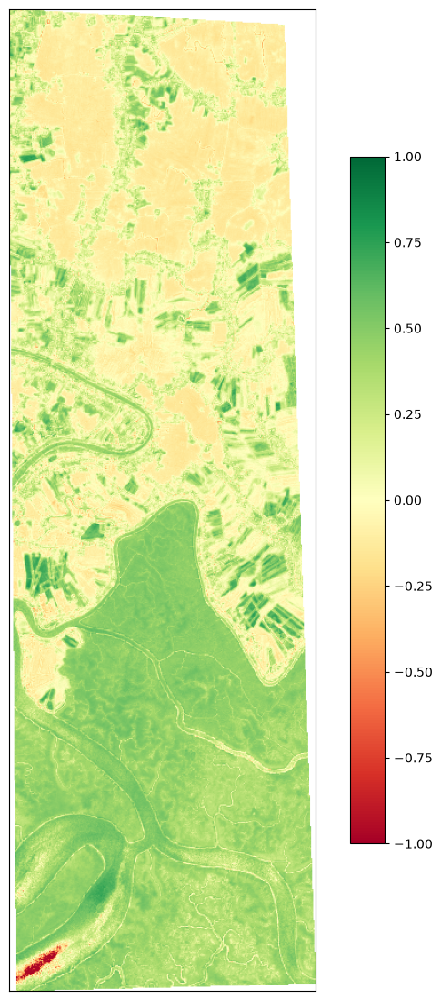

NDMI range : -0.976 to +0.814


In [14]:
ndmi = es.normalized_diff(refl[BAND['B08']], refl[BAND['B11']])

ep.plot_bands(ndmi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))
plt.show()

print(f"NDMI range : {np.nanmin(ndmi):+.3f} to {np.nanmax(ndmi):+.3f}")

# Geology Indices

Satellite imagery and aerial photography are important tools in mineral exploration. Among other
things they show geologists and field crews the location of tracks, roads, fences and inhabited
areas.

## Clay Minerals

The clay ratio is the ratio of the **SWIR 1** and **SWIR 2** bands. It exploits the fact that
hydrous minerals such as clays and alunite absorb radiation in the 2.0–2.3 µm region. Because it
is a ratio, it mitigates illumination changes caused by terrain.

$$ \text{Clay ratio} = \frac{SWIR_1}{SWIR_2} = \frac{B11}{B12} $$

**Two cautions, and the second one matters more than the first.**

*Display scale.* A band ratio is strictly positive and usually falls between roughly 0.5 and 3.
Plotting it on a −1 to +1 colour scale wastes half the range and saturates everything above 1,
so we scale to the data.

*Applicability.* These are **mineral-exploration indices**, designed for arid, rock-dominated
terrain. The Sundarbans is a water-dominated mangrove delta, where SWIR reflectance over water
is close to zero. Dividing by a near-zero denominator produces enormous values, so the map ends
up dominated by water artefacts rather than by geology. We restrict the display to land pixels
below and report what happens over water, because *knowing when an index does not apply* is as
useful as knowing how to compute it.

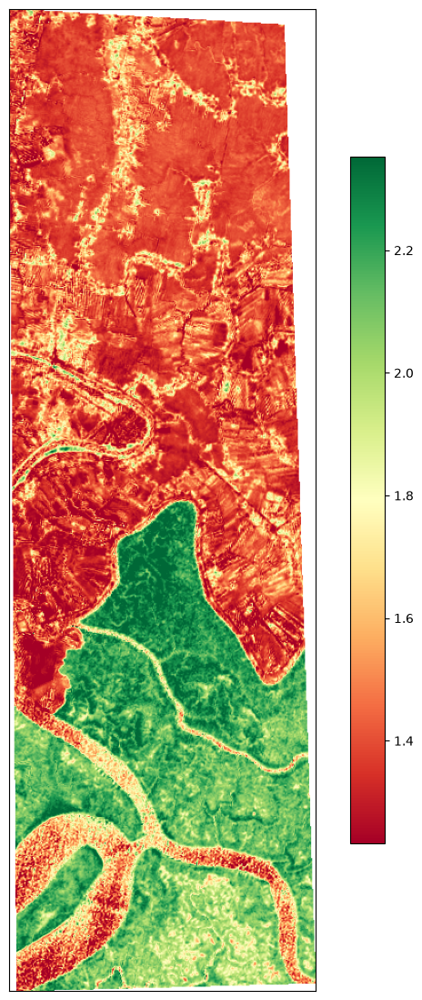

Clay ratio (B11/B12)
  over land  : 1.23 to 2.35   (display range)
  over water : up to 3  <- the denominator is near zero, so this is an artefact, not geology


In [15]:
cmr = np.divide(refl[BAND['B11']], refl[BAND['B12']])

# Land only: water has near-zero SWIR, so the ratio is meaningless there.
land = valid & (np.asarray(mndwi) < 0)
lo, hi = np.nanpercentile(cmr[land], [2, 98])

ep.plot_bands(cmr, cmap="RdYlGn", cols=1, vmin=lo, vmax=hi, figsize=(10, 14))
plt.show()

print(f"Clay ratio (B11/B12)")
print(f"  over land  : {np.nanpercentile(cmr[land], 2):.2f} to "
      f"{np.nanpercentile(cmr[land], 98):.2f}   (display range)")
print(f"  over water : up to {np.nanmax(cmr[valid & ~land]):.0f}  <- the denominator is "
      f"near zero, so this is an artefact, not geology")

## Ferrous Minerals

The ferrous minerals ratio highlights iron-bearing materials. It uses the ratio between the
**SWIR 1** and **NIR** bands.

$$ \text{Ferrous ratio} = \frac{SWIR_1}{NIR} = \frac{B11}{B08} $$

The same display consideration applies as for the clay ratio.

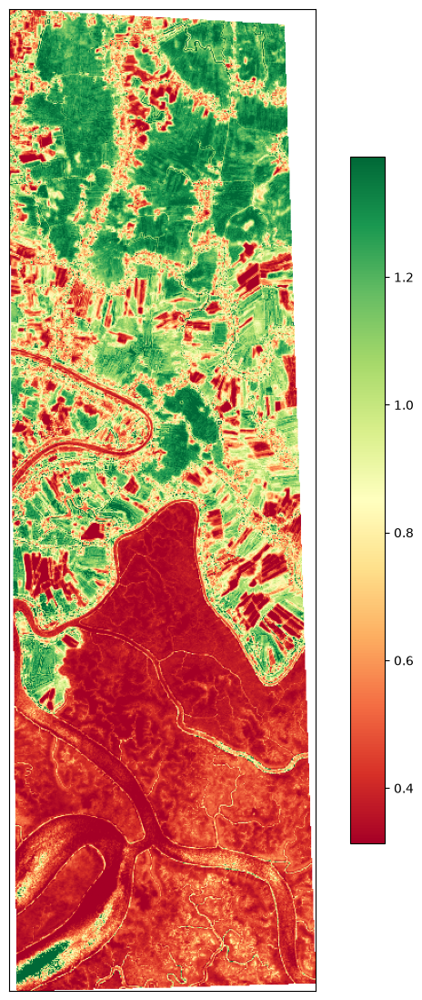

Ferrous ratio (B11/B08)
  over land  : 0.31 to 1.39   (display range)
  over water : up to 82  <- artefact again

Low values indicate a strong NIR response relative to SWIR, which here means
healthy mangrove rather than anything iron-bearing.


In [16]:
fmr = np.divide(refl[BAND['B11']], refl[BAND['B08']])

lo, hi = np.nanpercentile(fmr[land], [2, 98])
ep.plot_bands(fmr, cmap="RdYlGn", cols=1, vmin=lo, vmax=hi, figsize=(10, 14))
plt.show()

print(f"Ferrous ratio (B11/B08)")
print(f"  over land  : {lo:.2f} to {hi:.2f}   (display range)")
print(f"  over water : up to {np.nanmax(fmr[valid & ~land]):.0f}  <- artefact again")
print()
print("Low values indicate a strong NIR response relative to SWIR, which here means")
print("healthy mangrove rather than anything iron-bearing.")

# What to take away

Four habits, each of which prevented a specific error in this notebook.

**Name your bands, never count them.** An alphabetical file listing puts `B8A` after `B12`, so
position 8 in the stack is not band 8. Building a `BAND` dictionary from the filenames removes
an entire class of silent mistake.

**Cast to float before you do arithmetic.** The files are `uint16`, which cannot hold a negative
number. Over water, NIR is lower than red, so `NIR - Red` wraps around to a huge positive value
and NDVI reports rivers as the most vigorous vegetation in the scene.

**Convert to physical units before applying any index with an additive constant.** Ratios such
as NDVI survive a change of scale; SAVI, EVI and anything else with a `+ L` term do not.

**Choose display limits from the data.** A ratio is not bounded to [−1, 1], and the 16-bit
container is not the data range. Scaling to the wrong interval produces a picture that is tidy
and misleading.

### Optional extension

We built a `valid` mask from the alpha channel, but used it only for statistics. Try applying it
to the maps as well, with `np.where(valid, ndvi, np.nan)`, and see how the border changes. Then
consider what else should be masked in a real study: cloud, cloud shadow and sun glint, none of
which this scene happens to contain.